# Task 2

In [1]:
import pandas as pd
import cv2
import numpy as np

from google.colab.patches import cv2_imshow

In [2]:
def GetSobel(image, Sobel, width, height):
    I_d = np.zeros((width, height), np.float32)
    for rows in range(width):
        for cols in range(height):
            if rows >= 1 or rows <= width-2 and cols >= 1 or cols <= height-2:
                for ind in range(3):
                    for ite in range(3):
                        I_d[rows][cols] += Sobel[ind][ite] * image[rows - ind - 1][cols - ite - 1]
            else:
                I_d[rows][cols] = image[rows][cols]

    return I_d


def HarrisCornerDetection(image):
    gradx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]) #Sobel
    grady = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    r, c = image.shape
    dx = GetSobel(image, gradx, r, c)
    dy = GetSobel(image, grady, r, c)
    # cv2_imshow(dx)
    # cv2_imshow(dy)
    Ixx = np.square(dx)
    Iyy = np.square(dy)
    Ixy = np.multiply(dx, dy)
    sigma = 1.5
    kernel_size = (7, 7)
    Ixx = cv2.GaussianBlur(Ixx, kernel_size, sigma)
    Iyy = cv2.GaussianBlur(Iyy, kernel_size, sigma)
    Ixy = cv2.GaussianBlur(Ixy, kernel_size, sigma)
    alpha = 0.06
    result = np.zeros((r, c), np.float32)
    for row in range(r):
        for col in range(c):
            matrix = np.array([[Ixx[row][col], Ixy[row][col]], [Ixy[row][col], Iyy[row][col]]])
            result[row][col] = np.linalg.det(matrix) - (alpha * np.square(np.trace(matrix)))
    return result

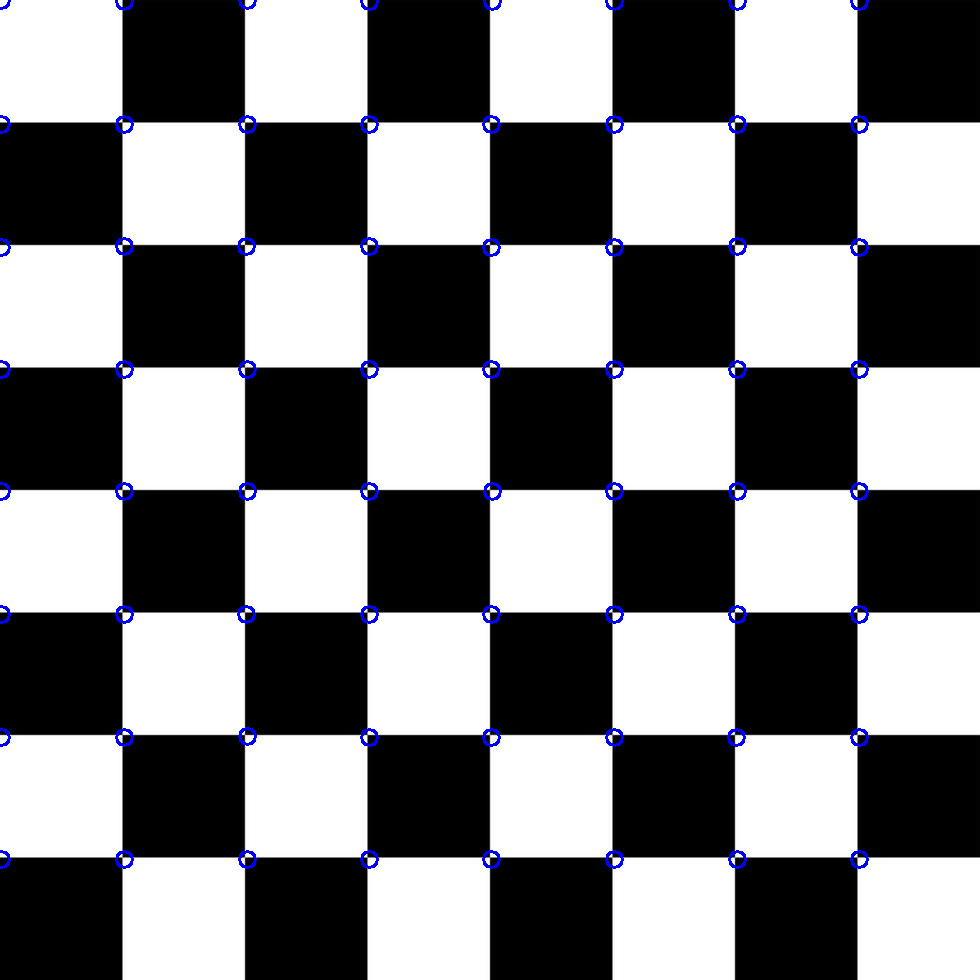

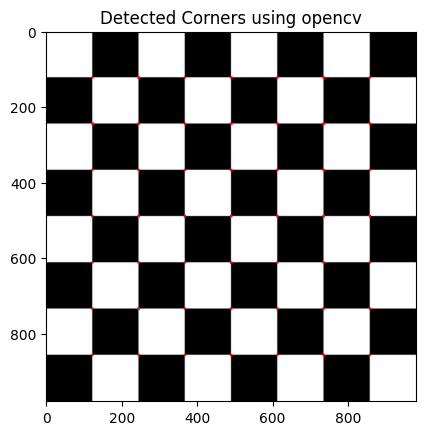

In [12]:
imagepath = '/content/modern-black-chess-board-with-letters-and-numbers-background-design-illustration-free-vector.jpg'
gray_image = cv2.imread(imagepath, cv2.IMREAD_GRAYSCALE)
r, c = gray_image.shape
orig_image = cv2.imread(imagepath)
res = HarrisCornerDetection(gray_image)

CornerStrengthThreshold = 600
radius = 8
color = (255, 0 , 0)
thickness = 2

PointList = []
for row in range(r):
    for col in range(c):
        if res[row][col] > CornerStrengthThreshold:
            max = res[row][col]
            skip = False
            for nrow in range(5):
                for ncol in range(5):
                    if row + nrow - 2 < r and col + ncol - 2 < c:
                        if res[row + nrow - 2][col + ncol - 2] > max:
                            skip = True
                            break
            if not skip:
                cv2.circle(orig_image, (col, row), radius, color, thickness)
                PointList.append((row, col))

cv2_imshow(orig_image)

image_2 = cv2.imread(imagepath)
grayimage2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2GRAY)
dest = cv2.cornerHarris(grayimage2, 2, 5, 0.07)
dest = cv2.dilate(dest, None)
image_2[dest > 0.01 * dest.max()]=[255, 0, 0]
plt.imshow(image_2)
plt.title('Detected Corners using opencv')
plt.show()

# Task 1

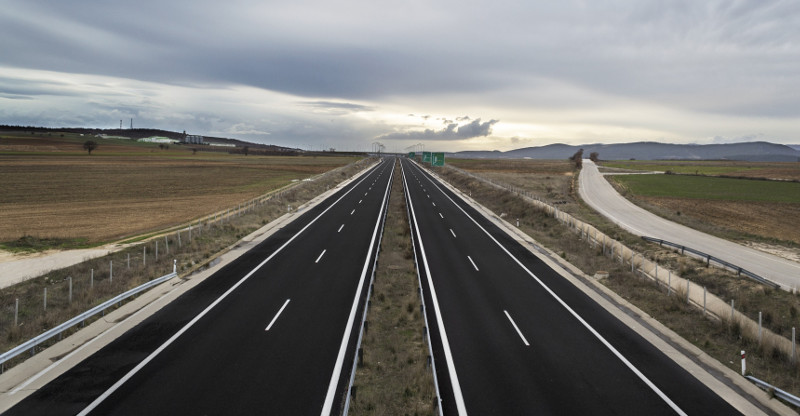

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
%matplotlib inline
from google.colab.patches import cv2_imshow

image = cv2.imread('/content/highway.jpg')
gray_scale = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
cv2_imshow(image)

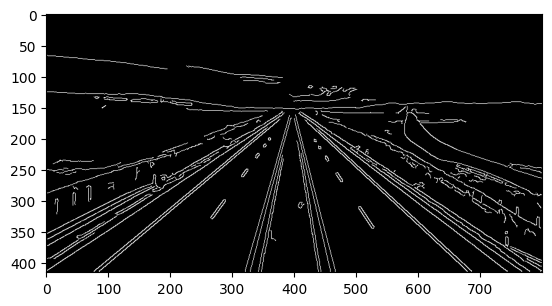

In [3]:
filtered =  cv2.GaussianBlur(gray_scale, (7, 7), 1.5)
low_threshold = 50
high_threshold = 100
edges = cv2.Canny(filtered, low_threshold, high_threshold)

plt.imshow(edges, cmap='gray')

with the following arguments:
* dst: Output of the edge detector. It should be a grayscale image (although in fact it is a binary one)
* lines: A vector that will store the parameters (r,θ) of the detected lines
* rho : The resolution of the parameter r in pixels.
* theta: The resolution of the parameter θ in radians.
* threshold: The minimum number of intersections to "*detect*" a line

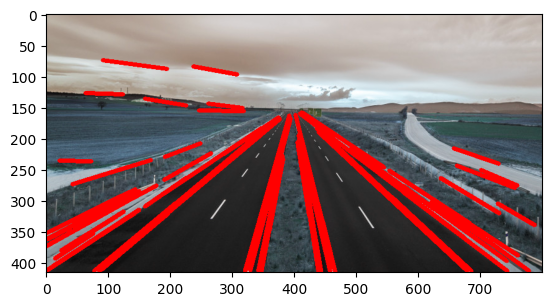

In [4]:
rho = 1
theta = np.pi/180
threshold = 30
min_line_length = 50
max_line_gap = 5
line_image = np.copy(image)
lines = cv2.HoughLinesP(edges, rho, theta, threshold, np.array([]),
                        min_line_length, max_line_gap)

for line in lines:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image,(x1,y1),(x2,y2),(255,0,0),5)

plt.imshow(line_image)

with the arguments:
* gray: Input image (grayscale).
* circles: A vector that stores sets of 3 values: xc,yc,r for each detected circle.
* HOUGH_GRADIENT: Define the detection method.
* dp = 1: The inverse ratio of resolution.
* min_dist = gray.rows/16: Minimum distance between detected centers.
* param_1 = 200: Upper threshold for the internal Canny edge detector.
* param_2 = 100*: Threshold for center detection.
* min_radius = 0: Minimum radius to be detected. If unknown, put zero as default.
* max_radius = 0: Maximum radius to be detected. If unknown, put zero as default.

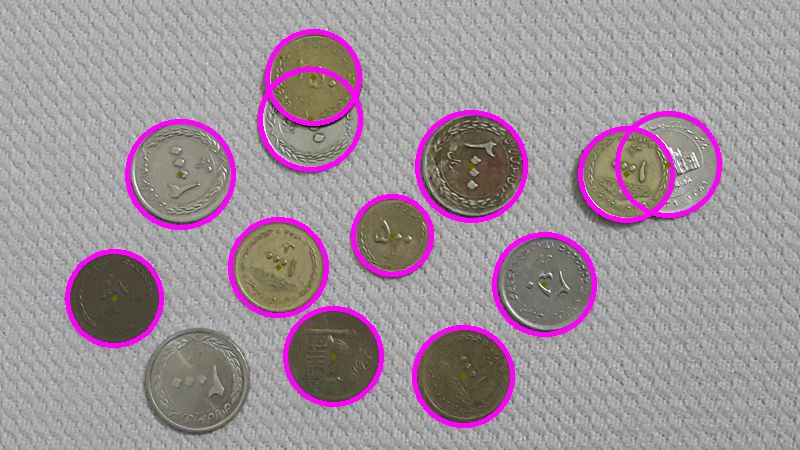

In [5]:
image = cv2.imread('/content/coins.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

gray = cv2.GaussianBlur(gray, (7, 7), 1.5)
rows = gray.shape[0]
circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1.3, 30, param1=150, param2=70, minRadius=0, maxRadius=0)

if circles is not None:
    circles = np.uint16(np.around(circles))
    for i in circles[0, :]:
        center = (i[0], i[1])
        cv2.circle(image, center, 1, (0, 100, 100), 3)
        radius = i[2]
        cv2.circle(image, center, radius, (255, 0, 255), 3)

cv2_imshow(image)

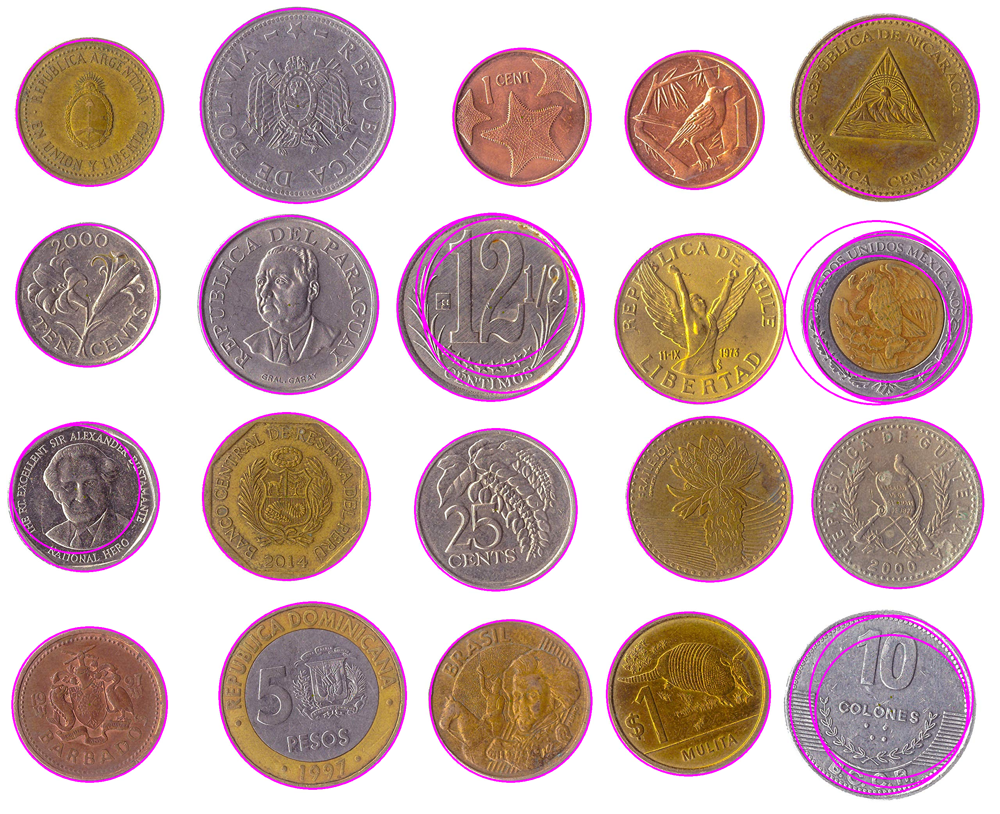

In [18]:
image = cv2.imread('/content/coin2.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

gray = cv2.GaussianBlur(gray, (7, 7), 1.5)
rows = gray.shape[0]
circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1.3, 30, param1=300, param2=80, minRadius=160, maxRadius=250)

if circles is not None:
    circles = np.uint16(np.around(circles))
    for i in circles[0, :]:
        center = (i[0], i[1])
        cv2.circle(image, center, 1, (0, 100, 100), 3)
        radius = i[2]
        cv2.circle(image, center, radius, (255, 0, 255), 3)

cv2_imshow(image)

# Task 3

Image Size: (512, 512)


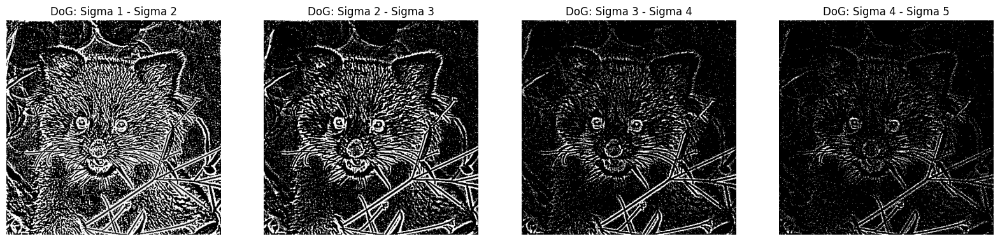

Image Size: (256, 256)


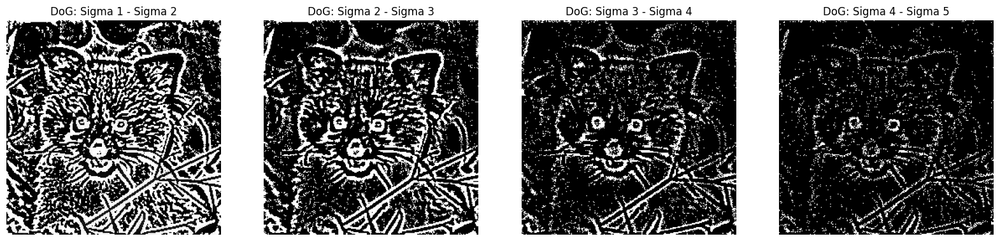

Image Size: (128, 128)


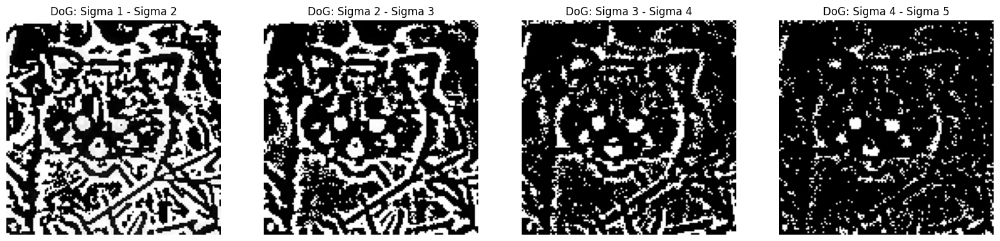

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

sigma = [1, 2, 3, 4, 5]
num_levels = 5

def create_dog_pyramid(image):
    gaussian_images = []
    for sig in sigma:
        img = cv2.GaussianBlur(image, (7, 7), sig)
        gaussian_images.append(img)

    dogs = []
    for i in range(num_levels - 1):
        img = gaussian_images[i] - gaussian_images[i+1]
        dogs.append(img)

    return gaussian_images, dogs

scales = [(512, 512), (256, 256), (128, 128)]

for scale in scales:
    img = cv2.imread('/content/panda.png', cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, scale)
    print(f'Image Size: {img.shape}')
    gaussian_images, dogs = create_dog_pyramid(img)

    # # Plot Gaussian images in one row
    # plt.figure(figsize=(20, 5))
    # for i, g_img in enumerate(gaussian_images):
    #     plt.subplot(1, num_levels, i + 1)
    #     plt.imshow(g_img, cmap='gray')
    #     plt.axis('off')
    #     plt.title(f'Sigma: {sigma[i]}')

    # plt.show()

    # Plot DoG images in one row
    plt.figure(figsize=(20, 5))
    for i, d_img in enumerate(dogs):
        plt.subplot(1, num_levels - 1, i + 1)
        plt.imshow(d_img, cmap='gray')
        plt.axis('off')
        plt.title(f'DoG: Sigma {sigma[i]} - Sigma {sigma[i + 1]}')

    plt.show()
